# Анализ рынка заведений общественного питания Москвы

Для фонда «Shut Up and Take My Money» мы подготовим исследование рынка Москвы, найдем интересные особенности, которые в будущем помогут в выборе подходящего инвесторам места для открытия заведения общественного питания. анализировать мы будем датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.  
Работу мы разделим на 6 шагов:
1. [Загрузка данных и подготовка к анализу](#step1) 
2. [Анализ данных](#step2) 
3. [Анализ рынка для открытия кофейни](#step3) 
4. [Презентация](#step4) 
5. [Вывод](#step5) 
6. [Рекомендация по открытию кофейни](#step6)  
 


 <a id='step1'></a>  

## Загрузка данных и подготовка к анализу


Импортируем необходимые для работы библиотеки.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime as dt
import numpy as np
import seaborn as sns
import warnings
import math as mth
import plotly.express as px
from plotly import graph_objects as go
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

from datetime import datetime, timedelta

Уберем ограничение по выводу строк, колонок и символов в записи, а также предупреждения Jupiter.

In [2]:
# Сброс ограничений на количество выводимых рядов
pd.set_option('display.max_rows', None)
 
# Сброс ограничений на число столбцов
pd.set_option('display.max_columns', None)
 
# Сброс ограничений на количество символов в записи
pd.set_option('display.max_colwidth', None)

#Игнорируем предупреждения Jupiter
warnings.filterwarnings('ignore')

### Загрузка данных

Запишем датасет moscow_places.csv в датафрейм moscow_places, посмотрим информацию о датафрейме и первые 5 строк.

In [3]:
try:
    moscow_places = pd.read_csv('/datasets/moscow_places.csv')
except:
    moscow_places = pd.read_csv('moscow_places.csv')

In [4]:
display(moscow_places.head())
print()
print(moscow_places.info())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None


`name` — название заведения;  
`address` — адрес заведения;  
`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;  
`hours` — информация о днях и часах работы;  
`lat` — широта географической точки, в которой находится заведение;  
`lng` — долгота географической точки, в которой находится заведение;  
`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);  
`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;  
`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:  
- «Средний счёт: 1000–1500 ₽»;  
- «Цена чашки капучино: 130–220 ₽»;  
- «Цена бокала пива: 400–600 ₽».  
- и так далее;  
  
`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:  
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
- Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.  
  
`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:  
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
- Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.  
  
`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):  
- 0 — заведение не является сетевым  
- 1 — заведение является сетевым  
  
`district` — административный район, в котором находится заведение, например Центральный административный округ;  
`seats` — количество посадочных мест.  


В нашем распоряджении датафрейм moscow_places с 14 столбцами и 8406 строками.

### Проверка на дубли

Проверим датафрейм на явные дубли.

In [5]:
print(f'Явных дублей в датафреме {moscow_places.duplicated().sum()}')

Явных дублей в датафреме 0


Явных дублей нет.

Проверим на неявные дуюли. Посмотрим, как записаны у нас события в столбцах `category` и `district`.

In [6]:
for i in ('category', 'district'):
    print('В столбце',i)
    print()
    print(moscow_places[i].value_counts())


В столбце category

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64
В столбце district

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64


Проверим комбинацию название заведения и адрес. Для начала приведем названия и адрес к нижнему регистру.

In [7]:
moscow_places['name'] = moscow_places['name'].str.lower()
moscow_places[['name', 'address']].duplicated().sum()

3

3 дубля, посмотрим на них.

In [8]:
moscow_places[moscow_places[['name', 'address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Есть заведения на одной улице с одинаковыми названиями, но с разными категориями или режимами работы, возможно, это старые данные о заведениях вместе с новми. Удалим дубли.

In [9]:
moscow_places = moscow_places.drop_duplicates(subset=['name', 'address'], keep='first')

Проверим, что дубликаты удалились.

In [10]:
moscow_places[moscow_places[['name', 'address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Мы удалили дубли.

### Проверка на пропуски

Проверим, есть ли в нашем датафрейме пропуски.

In [11]:
print(f'Пропусков в датафреме {moscow_places.isna().sum()}')

Пропусков в датафреме name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
dtype: int64


И посмотрим на количество пропусков в процентном соотношении.

In [12]:
pd.DataFrame(round(moscow_places.isna().mean()*100,1)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.500000
avg_bill,54.600000


У нас есть пропуски в столбцах `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` и `seats`.  
Т.к. датасет  составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес, а информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках можно допустить, что для каких-то заведений пользователи просто не добавляли информацию (может быть это новое заведение, или не очень популярное, или просто не нашлось пользователя, который бы внес информацию). А также логично предположить, что при пропуске в столбце `avg_bill` будут пропуски в столбцах `middle_avg_bill`, `middle_coffee_cup`, а даже для там, где указаны значения `avg_bill` пользователи не успели еще оценить `middle_avg_bill`, `middle_coffee_cup`.  
На данном этапе мы не будем заполнять эти пропуски какими-либо значениями, или удалять строки с пропусками.

In [13]:
print(moscow_places.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8403 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8403 non-null   object 
 2   address            8403 non-null   object 
 3   district           8403 non-null   object 
 4   hours              7868 non-null   object 
 5   lat                8403 non-null   float64
 6   lng                8403 non-null   float64
 7   rating             8403 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8403 non-null   int64  
 13  seats              4792 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.7+ KB
None


### Изучение столбцов

Посмотрим, сколько уникальных заведений предаслено в нашем датафрейме.

In [14]:
print(f"Уникальных заведений в датафрейме - {moscow_places['name'].nunique()}")

Уникальных заведений в датафрейме - 5512


Всего у нас 8406 завдений, из них уникальных - 5614.

Посмотрим, какой рейтинг представлен.

In [15]:
print(f"Рейтинг в столбце rating имеет значение от {moscow_places['rating'].min()} до {moscow_places['rating'].max()}")

Рейтинг в столбце rating имеет значение от 1.0 до 5.0


Рейтинг принимает значения от 1 до 5.

Проверим, что в столбце `chain` указаны только 1 и 0, как указатели, является ли заведение сетевым (1) или нет (0).

In [16]:
moscow_places['chain'].unique()

array([0, 1])

Да, только 1 и 0.

Посмотрим, какие значения принимает столбец с количеством мест:

In [17]:
print(f"Количество мест в столбце seats имеет значение от {moscow_places['seats'].min()} до {moscow_places['seats'].max()}")

Количество мест в столбце seats имеет значение от 0.0 до 1288.0


От 0 до 1288. на первый взгляд 0 мест выглядит странным, но может быть, это завдения где можно только забрать заказ, т.н. grab and go. посмотрим на 10 заведений с нулями в этом столбце.

In [18]:
moscow_places[moscow_places['seats'] == 0].head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
84,meat doner kebab,булочная,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896987,37.608126,4.5,NaN,Средний счёт:300 ₽,300.0,NaN,0,0.0
177,арамье,булочная,"Москва, улица 800-летия Москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,NaN,NaN,NaN,NaN,1,0.0
196,донер-шашлык,ресторан,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896962,37.608300,4.5,NaN,NaN,NaN,NaN,0,0.0
203,тандыр № 1,кафе,"Москва, улица Лескова, 22Г",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.895615,37.611049,4.0,NaN,NaN,NaN,NaN,1,0.0
211,неаполитан пицца,кафе,"Москва, улица Пришвина, 23",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.885416,37.604650,4.3,NaN,NaN,NaN,NaN,0,0.0
266,пекарня&донер,булочная,"Москва, Широкая улица, 21",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.887751,37.672475,4.1,NaN,NaN,NaN,NaN,0,0.0
284,центр плов,кафе,"Москва, Широкая улица, 16А",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.887348,37.662315,4.2,NaN,NaN,NaN,NaN,0,0.0
290,шаурма,кафе,"Москва, Осташковская улица, 7, корп. 1",Северо-Восточный административный округ,NaN,55.877350,37.679414,3.3,NaN,NaN,NaN,NaN,0,0.0
306,everest coffee,кофейня,"Москва, Сходненская улица, 50",Северо-Западный административный округ,"пн-чт 08:00–22:00; пт 08:00–23:00; сб,вс 09:00–23:00",55.847770,37.440586,4.9,средние,Цена чашки капучино:200–300 ₽,NaN,250.0,0,0.0
337,пекарня маковка,пиццерия,"Москва, Сходненская улица, 35, корп. 1",Северо-Западный административный округ,"ежедневно, 08:00–22:00",55.848505,37.439135,4.9,NaN,NaN,NaN,NaN,0,0.0


Есть как булочные и кофейни, в которых действительно может не быть мест, но также представлены и рестораны, в которых обязательны сидячие места. Значит в каких-то случаях 0 могли поставить по ошибке, или была ошибка с выгурзкой данных. посмотрим, сколько у нас таких строк.

In [19]:
moscow_places[moscow_places['seats'] == 0]['seats'].count()

136

136 строк. На данном этапе не будем с ними ничего делать.

### Создание столбца с названием улицы

Выделим из столбца с адресом улицу и запишем ее в новый столбце.  
Для начала посмотрим, как у нас записаны адреса.

In [20]:
moscow_places['address'].sample(10)

3397          Москва, Большая Грузинская улица, 39
2312    Москва, Краснобогатырская улица, 2, стр. 2
4942     Москва, Новоспасский переулок, 3, корп. 2
4223              Москва, Кутузовский проспект, 35
7876                  Москва, Каширское шоссе, 61Г
3535      Москва, Большая Никитская улица, 23/14/9
5065                       Москва, улица Балчуг, 5
8200                   Москва, Варшавское шоссе, 7
1284         Москва, улица Народного Ополчения, 22
2827                 Москва, Щербаковская улица, 3
Name: address, dtype: object

Можно заметить, что всегда в адресе указан сначала город, потом улица (это может быть улица, проезд, проспект), потом дом, и улица отделена запятой и пробелом.  
Создадим функцию для выделения улицы из строки.

In [21]:
moscow_places.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8403 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8403 non-null   object 
 2   address            8403 non-null   object 
 3   district           8403 non-null   object 
 4   hours              7868 non-null   object 
 5   lat                8403 non-null   float64
 6   lng                8403 non-null   float64
 7   rating             8403 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8403 non-null   int64  
 13  seats              4792 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.7+ KB


In [22]:
#создаем улицу
def street_extract(data):
    #деолим страку с адресом на 3 части, по запятой с пробелом
    address = data['address'].split(', ', 2)
    #из поделенной строки берем второй элемент, т.е. название улицы
    street = address[1]
    #возвращаем название улицы
    return street

Применим функцию и проверим результат.

In [23]:

#прмиеняем функцию
moscow_places['street'] = moscow_places.apply(street_extract, axis=1)
#выводим случайные 10 строк
moscow_places[['address', 'street']].sample(10)

,address,street
4330,"Москва, Нижний Сусальный переулок, 4, стр. 3",Нижний Сусальный переулок
1353,"Москва, Ленинградское шоссе, 16Ас8",Ленинградское шоссе
1364,"Москва, Балтийская улица, 3",Балтийская улица
2515,"Москва, Бауманская улица, 7с1",Бауманская улица
2491,"Москва, 1-я Останкинская улица, 55",1-я Останкинская улица
2400,"Москва, проспект Мира, 26, стр. 2",проспект Мира
5834,"Москва, Сколковское шоссе, 32",Сколковское шоссе
7938,"Москва, улица Генерала Белова, 28, корп. 1",улица Генерала Белова
6055,"Москва, улица Кедрова, 14, корп. 3",улица Кедрова
2848,"Москва, Семёновская площадь, 7, корп. 17",Семёновская площадь


Все получилось.

### Создание столбца с указанием режима работы заведения

Cоздадим столбец `is_24/7` в котором отметим, является ли заведение круглосуточным.  Посмотрим на то, как записаны режимы работы у нас в таблоице:

In [24]:
moscow_places['hours'].value_counts().head(10)

ежедневно, 10:00–22:00      759
ежедневно, круглосуточно    730
ежедневно, 11:00–23:00      396
ежедневно, 10:00–23:00      310
ежедневно, 12:00–00:00      254
ежедневно, 09:00–21:00      204
ежедневно, 09:00–22:00      184
ежедневно, 12:00–23:00      178
ежедневно, 08:00–23:00      160
ежедневно, 08:00–22:00      148
Name: hours, dtype: int64

Как мы видим, если заведение работает ежедневно, то в строке есть указание "ежедневно", а если круглосуточно, то "круглосуточно". Тогда проверим наш столбце `hours` на наличие этих ключевых фраз, и запишем результат в столбец `is_24/7`.

In [25]:
#Проверяем строки в столбце по условию
moscow_places['is_24/7'] = moscow_places['hours'].str.contains('ежедневно') & moscow_places['hours'].str.contains('круглосуточно')

#выводим случайные 10 строк
moscow_places.sample(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
2117,джи джи гриль,пиццерия,"Москва, 1-й Лучевой просек, 1",Восточный административный округ,"ежедневно, 11:00–23:00",55.795494,37.669428,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,50.0,1-й Лучевой просек,False
1696,дача гашека,"бар,паб","Москва, Долгоруковская улица, 31, стр. 32",Центральный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–03:00; вс 12:00–00:00",55.777440,37.601842,5.0,выше среднего,Цена бокала пива:280 ₽,NaN,NaN,0,160.0,Долгоруковская улица,False
4317,ворона,кофейня,"Москва, Пресненская набережная, 12",Центральный административный округ,пн-пт 08:00–20:00,55.749851,37.537107,4.0,средние,Средний счёт:500–1000 ₽,750.0,NaN,0,300.0,Пресненская набережная,False
2826,кафе,быстрое питание,"Москва, Измайловский проспект, вл53Ас1",Восточный административный округ,"ежедневно, круглосуточно",55.788184,37.779432,3.8,NaN,NaN,NaN,NaN,0,NaN,Измайловский проспект,True
5825,эспрессо,ресторан,"Москва, Сколковское шоссе, 31, стр. 1",Западный административный округ,"ежедневно, 10:00–21:00",55.706419,37.404748,3.6,NaN,NaN,NaN,NaN,0,50.0,Сколковское шоссе,False
5708,вино и еда by первый нос,"бар,паб","Москва, Гжатская улица, 5, корп. 1",Западный административный округ,"ежедневно, 11:00–23:00",55.714546,37.436319,4.2,NaN,NaN,NaN,NaN,0,NaN,Гжатская улица,False
6193,crazy kitch brothers,"бар,паб","Москва, Ломоносовский проспект, 25, корп. 5",Западный административный округ,"ежедневно, 16:00–00:00",55.693049,37.530725,4.3,NaN,Цена бокала пива:250–550 ₽,NaN,NaN,0,60.0,Ломоносовский проспект,False
7521,шаурма & гриль,кафе,"Москва, улица Борисовские Пруды, 8, корп. 3",Южный административный округ,NaN,55.632940,37.739249,3.3,NaN,NaN,NaN,NaN,0,200.0,улица Борисовские Пруды,False
2920,kafin,кафе,"Москва, Большая Семёновская улица, 40",Восточный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–17:00",55.780427,37.712354,4.1,NaN,NaN,NaN,NaN,1,NaN,Большая Семёновская улица,False
2248,петтина,ресторан,"Москва, улица Космонавтов, 2А",Северо-Восточный административный округ,"ежедневно, 11:00–05:00",55.820855,37.644240,4.1,высокие,Средний счёт:2000 ₽,2000.0,NaN,0,NaN,улица Космонавтов,False


Столбцец готов.

**Вывод**  
Мы подготовили данные к анализу:  
- проверили на яаные дубли, и удалили неявные,
- проверили на пропуски,
- добавили столбцы с названием улицы и с указанием, работает ли заведение 24/7.

 <a id='step2'></a>  

## Анализ данных

### Категории заведений

Взглянем подробнее, какие категорий представлены у нас в датасете.

In [26]:
category = pd.DataFrame(moscow_places['category'].value_counts())
category

,category
кафе,2377
ресторан,2042
кофейня,1413
"бар,паб",764
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


Визуализируем таблицу.

In [27]:
# делаем интерактивную круговую диаграму
fig = go.Figure(data=[go.Pie(labels=category.index, 
                             values=category['category'],
                             pull = [0.1, 0])])
# добавляем на график название
fig.update_layout(title='Категории заведений', 
                  # ширину графика
                  width=700, 
                  # высоту графика
                  height=500,
                  # настройки легенды
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Наименование категории',
                                    showarrow=False)])
# выводим график на экран
fig.show()

и отобразим на столбчатой диаграмме данные.

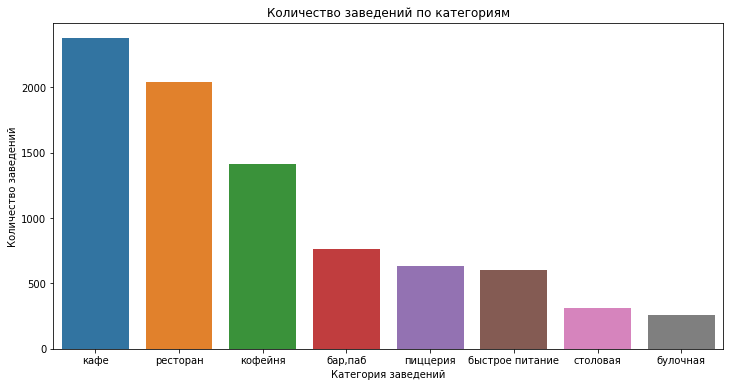

In [28]:
plt.figure(figsize=(12,6))
fig = sns.barplot(x=category.index, y ='category', data = category)
plt.xlabel('Категория заведений')
plt.ylabel('Количество заведений')
plt.title('Количество заведений по категориям') 
plt.show()

Мы видим, что больше половины всех заведений - это кафе (28,3 %) и рестораны (24,3 %), а третьем месте идут кофейни (16,8%), самая маленькая категория - булочная (3,05%).

### Количество посадочных мест

Посмотрим, как рапсределены посадочные места в заведениях в датасете.

In [29]:
fig = px.histogram(moscow_places, # загружаем данные
                   x='seats', # указываем столбец с данными для оси X
                   title='Распределение посадочных мест заведений', # указываем заголовок
                   nbins=100, # назначаем число корзин
                   barmode='overlay') # выбираем «полупрозрачный» тип отображения столбцов
fig.update_xaxes(title_text='Количество посадочных мест') # подпись для оси X
fig.update_yaxes(title_text='Частота') # подпись для оси Y
fig.show() # выводим график

Мы видим, что есть заведения без мест (это могут быть булочные, кофейни без столиков и т.п.), так и с 1288 мест (могут быть большие ивент-холлы). Также мы видим, что есть явный пик на 40-59 мест, скорее всего, это стандартный размер кафе или ресторана. Посмотрим, каких заведений больше всего. 

In [30]:
moscow_places['seats'].describe(percentiles=[.25, .5, .75, .95, .99])

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
95%       307.000000
99%       625.000000
max      1288.000000
Name: seats, dtype: float64

Мы видим, что медианное значение - 75 мест, а среднее количество - 108 мест. 95% заведений имеют до 307 мест, а 99 % заведений имеют 625 мест.

Посмотрим, как респределяются посадочные места по категориям

In [31]:
fig = px.histogram(moscow_places, # загружаем данные
                   x='seats', # указываем столбец с данными для оси X
                   color='category', # обозначаем категорию для разделения цветом
                   title='Распределение посадочных мест заведений', # указываем заголовок
                   nbins=100, # назначаем число корзин
                   barmode='overlay') # выбираем «полупрозрачный» тип отображения столбцов
fig.update_xaxes(title_text='Количество посадочных мест') # подпись для оси X
fig.update_yaxes(title_text='Частота') # подпись для оси Y
fig.show() # выводим график

График получается нагромажденным со всеми включенными категориями, но даже из него мы можем увидеть, что до 50 мест больше всего кафеен, а свыше 50 - ресторанов.  
Основные пики по местам:  
- столовая - 40-59 мест,
- булочная - 0-39 мест,
- быстрое питание - 0-19 мест,
- бар, паб - 40-59 мест,
- пиццерия - 20-39 мест,
- кофейня - 40-59 мест,
- ресторан - 40-59 мест,
- кафе - 40-59 мест.

Посмотрим, какое среднее количество мест приходится на заведения каждой категории.

In [32]:
#сгруппируем данные по категориям
category_seats_mean =  (moscow_places.groupby(['category'])
                 #считаем среднее количество мест для каждой категории
                    .agg({'seats': 'mean'})
                 #переименовываем столбец
                    .rename(columns={'seats': 'mean_seats'})
                 #Округляем значения до целых
                    .round()
                 #сбрасываем индекс
                    .reset_index()
                 #сортируем категории по среднему количеству мест
                    .sort_values(by='mean_seats', ascending=True))


# строим столбчатую диаграмму 
fig = px.bar(category_seats_mean, # загружаем данные
             x='mean_seats', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='mean_seats' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве мест внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Среднее количество мест в заведении по категориям',
                   xaxis_title='Среднее количество мест',
                   yaxis_title='Категория заведения')
fig.show() # выводим график

По среднему значению больше всего мест у баров, пабов - 125, но втором месте рестораны - 122, меньше всего мест у булочных - 89. Но средние значения могут быть искажены выбросами, аномальнобольшими единичными заведениями. Посмотрим на медианное значение.

In [33]:
#сгруппируем данные по категориям
category_seats_median =  (moscow_places.groupby(['category'])
                 #считаем медианное количество мест для каждой категории
                    .agg({'seats': 'median'})
                 #переименовываем столбец
                    .rename(columns={'seats': 'median_seats'})
                 #округляем значения до целых
                    .round()
                 #сбрасываем индекс
                    .reset_index()
                 #сортируем категории по среднему количеству мест
                    .sort_values(by='median_seats', ascending=True))


# строим столбчатую диаграмму 
fig = px.bar(category_seats_median, # загружаем данные
             x='median_seats', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='median_seats' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве мест внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Медианное количество мест в заведении по категориям',
                   xaxis_title='Медианое количество мест',
                   yaxis_title='Категория заведения')
fig.show() # выводим график

Количество мест в каждой категории стало меньше, что подтверждает нашу теорию об аномально больших заведениях. Порядок заведений тоже изменился - больше всего мест по медианным значениям у ресторана - 86, на втором месте бар, паб - 82 места, меньше всего мест также у булочных - 50. Распределение выглядит логичным, рестораны обычно большие, как и быры, на много посадочных мест, а булочные наоборот - небольшие. Выглядит странным, чтоу кофеен мест больше, чем у кафе, но это может быть связано, что кофейни популярные послежнее время, поэтому даже кафе и рестораны могут записыать, как кофейни для привлечения клиентов.

### Сетевые и несетевые заведения

Посмотрим на соотношение сетевых и несетевых заведений в датасете.

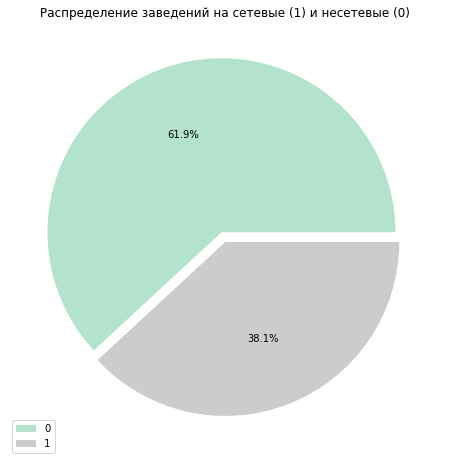

In [34]:
#группируем данные по типу заведения и считаем количество заведений в каждой группе
chain = moscow_places.groupby('chain').agg({'chain': 'count'}).rename(columns={'chain': 'count'})
#строим круговую диаграмму
chain['count'].plot(kind="pie",
                    #округляем значения процентов до десятых
                    autopct='%1.1f%%',
                    #один из сегментов выдивгаем из диаграммы для наглядности
                    explode=[0.05, 0.01],
                    #показываем легенду
                    legend=True,
                    #задаем название графика
                    title='Распределение заведений на сетевые (1) и несетевые (0)',
                    #название оси скрываем
                    ylabel='',
                    #убиаем дистанцию между названием и графиком
                    labeldistance=None,
                    #задаем размер графика
                    figsize=(8, 8),
                    #задаем цветовую гамму
                    cmap='Pastel2');



Мы видим, что почти 62% заведений в датасете являются несетевыми.

<div class="alert alert-success" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий ревьюера v.1</b> 
    
👍 
Супер, именно доля заведений корректно дает ответ на поставленный вопрос. 
</div>

### Категории сетевых заведений

Посмотрим, какой категории заведения чаще других являются сетевыми.

In [35]:
#выбираем из датасета только сетевые заведения
chain_category = (moscow_places[moscow_places['chain'] == 1]
                  #группируем данные по категориям
                  .groupby('category')
                  #считаем количество заведений в каждой категории
                  .agg({'name': 'count'})
                  #переименовываем столбце
                  .rename(columns={'name': 'count'})
                  #сортируем данные по убыванию
                  .sort_values(by='count', ascending=False))

# делаем интерактивную круговую диаграму
fig = go.Figure(data=[go.Pie(labels=chain_category.index, 
                             values=chain_category['count'],
                             pull = [0.1, 0])])
# добавляем на график название
fig.update_layout(title='Категории сетевых заведений', 
                  # ширину графика
                  width=700, 
                  # высоту графика
                  height=500,
                  # настройки легенды
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Наименование категории',
                                    showarrow=False)])
# выводим график на экран
fig.show()

Мы видим, что больше всего сетевых заведений в категории кафе (таких заведений 24,3% от общего числа сетевых), на втором месте рестораны - 22,8%, на третьем кофейни - 22,5%. Меньше всего сетевых заведений в категории столовая - их только 2,75%.  
Посмотрим, на долю сетевых заведений от общего количествва по категориям.

In [36]:
category = category.reset_index().rename(columns={'index': 'category', 'category': 'all_count'})
chain_category = chain_category.reset_index().rename(columns={'count': 'chain_count'})
percent_chain = category.merge(
    chain_category,
    on='category', # название столбца, по которому объединять, передают в параметре on
    how='inner', # режим объединения передают в параметре how
    )

percent_chain['persent'] = (percent_chain['chain_count'] * 100 / percent_chain['all_count']).round(1)
percent_chain = percent_chain.sort_values(by='persent')
display(percent_chain)

,category,all_count,chain_count,persent
3,"бар,паб",764,168,22.0
6,столовая,315,88,27.9
0,кафе,2377,779,32.8
1,ресторан,2042,729,35.7
5,быстрое питание,603,232,38.5
2,кофейня,1413,720,51.0
4,пиццерия,633,330,52.1
7,булочная,256,157,61.3


In [37]:
# строим столбчатую диаграмму 
fig = px.bar(percent_chain, # загружаем данные
             x='persent', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='persent' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве мест внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Процентное количество сетевых заведений по категориям',
                   xaxis_title='Процентное количество сетевых заведений',
                   yaxis_title='Категория')
fig.show() # выводим график

Больше всего сетевых заведений в категории булочная (около 61%), на втором месте - пиццерия (около 52%), меньше всего сетевых заведений в категории бар, паб (около 22%).

### Топ-15 популярных сетей в Москве

Посчитаем названия завдеений и посмотрим на 15 самых популярных сетей в Москве

In [38]:
top_15 = pd.DataFrame(moscow_places['name'].value_counts().head(15))
top_15

,name
кафе,189
шоколадница,120
домино'с пицца,77
додо пицца,74
one price coffee,72
яндекс лавка,69
cofix,65
prime,50
хинкальная,44
шаурма,43


Мы видим, что в наш топ попали заведнеи с названием кафе, шаурма, чайхана и ресторан - так на картах часто называют небольшие заведение, особенно в спальных районах. Выберем только сетевые заведения и выведем наш топ.

In [39]:
chain_top_15 = pd.DataFrame(moscow_places[moscow_places['chain']==1]['name']
                            .value_counts()
                            .head(15)
                            .reset_index()
                            .rename(columns={'index': 'name', 'name': 'count'}))
chain_top_15

,name,count
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


In [40]:
# строим столбчатую диаграмму 
fig = px.bar(chain_top_15.sort_values(by='count'), # загружаем данные
             x='count', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве мест внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Топ-15 самых распространенных сетевых заведений Москвы',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название сети заведений')
fig.show() # выводим график

Мы убрали заведения с названиями кафе и ресторан, но остались заведения с названием хинкальная и чайхана, возможно, действительно есть такие сети, или в названии не указали, что, например это чайхана №1 или хинкальная №1. Остальные заведения действительно являются сетевыми и их названия на слуху.  
Самая популярная сеть с большим отрывом - Шоколадница - 120 заведений, на втором месте Домино'c Пицца - 76 заведений, на третьем - Додо пицца - 74 заведения.  
взглянем, к каим категориям принадлежат эти заведения.

Отфильтруем наш датасет, оставив только заведения из топ 15.

In [41]:
#сделаем из столбца с названиями заведений список
chain_top_15_list  = chain_top_15['name'].tolist()
#отфильтруем датасет
top_15_moscow_places = moscow_places.query('name in @chain_top_15_list')

Посмотрим на категории.

In [42]:
#посчитаем заведения в каждой категории.
category_top_15 = pd.DataFrame(top_15_moscow_places['category'].value_counts())


# делаем интерактивную круговую диаграму
fig = go.Figure(data=[go.Pie(labels=category_top_15.index, 
                             values=category_top_15['category'],
                             pull = [0.1, 0])])
# добавляем на график название
fig.update_layout(title='Категории заведений топ 15 заведений по количеству Москвы', 
                  # ширину графика
                  width=700, 
                  # высоту графика
                  height=500,
                  # настройки легенды
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Наименование категории',
                                    showarrow=False)])
# выводим график на экран
fig.show()

Мы видим, что 41,2% заведений являются кофейни, 22,8% рестораны и 18,5% пиццерии.

Посмотрим, как эти заведения распределены по районам Москвы

In [43]:
#сгруппируем данные по району и категории
top_15_distr_cat = (top_15_moscow_places.groupby(['district', 'category'])
                 #считаем количество заведений
                    .agg({'name': 'count'})
                 #переименовываем столбец
                    .rename(columns={'name': 'count'})
                 #сбрасываем индекс
                    .reset_index())

#задаем колонки для нашей столбчатой диаграммы
fig = px.bar(top_15_distr_cat, x='district', y='count', color='category')

fig.update_xaxes(tickangle=15)
# оформляем график
fig.update_layout(title='Количество заведений по административным округам и категориям Топ-15 сетей',
                  xaxis_title='Административный округ',
                  yaxis_title='Количество заведений',
                  # ширину графика
                  width=900, 
                  # высоту графика
                  height=500,
                  # настройки легенды
                  legend=dict(
                      x=1,
                      y=1,
                      title="Категория заведений")
                 )



fig.show()

Мы видим, что больше всего заведений (более чем в 2 раза) в ЦАО, а меньше всего в СЗАО.  
Если смотреть по районам, то в ЦАО больше всего кофеен и ресторанов, а вот пиццерий больше всего в ЮАО.

### Административные районы Москвы

Посмотрим, как распределены заведения по районам Москвы по категориям.

In [44]:
#сгруппируем данные по району и категории
distr_cat = (moscow_places.groupby(['district', 'category'])
                 #считаем количество заведений
                    .agg({'name': 'count'})
                 #переименовываем столбец
                    .rename(columns={'name': 'count'})
                 #сбрасываем индекс
                    .reset_index())

#задаем колонки для нашей столбчатой диаграммы
fig = px.bar(distr_cat, x='district', y='count', color='category')

fig.update_xaxes(tickangle=15)
# оформляем график
fig.update_layout(title='Количество заведений по административным округам и категориям',
                  xaxis_title='Административный округ',
                  yaxis_title='Количество заведений',
                  # ширину графика
                  width=900, 
                  # высоту графика
                  height=500,
                  # настройки легенды
                  legend=dict(
                      x=1,
                      y=1,
                      title="Категория заведений")
                 )



fig.show()

Как и в случае с топ-15 сетями, больше всего заведений в ЦАО - это логично, т.к. этот район самый популярный для туризма или просто прогулок.  
Если смотреть по категориям:
- бар, паб - ЦАО - 364 заведения,
- булочная - ЦАО - 50 заведений,
- быстрое питание - ЦАО - 85 заведений,
- кафе - ЦАО - 464 заведения,
- кофейня - ЦАО - 428 заведений,
- пиццерия - ЦАО - 113 заведений,
- ресторан - ЦАО - 670 заведений,
- столовая - ЦАО - 66 заведений.  
Как мы видим, по всем категориям лидером по количеству заведений является ЦАО.


### Cредний рейтинг по категориям заведений

Посмотрим, как отличается средний ретинг заведения в зависимости от категории заведения.

In [45]:
#сгруппируем данные по категории
mean_rating = (moscow_places.groupby(['category'])
                 #считаем средний рейтинг
                    .agg({'rating': 'mean'})
                #округляем значения до сотых
                    .round(2)
                 #сбрасываем индекс
                    .reset_index())

# строим столбчатую диаграмму 
fig = px.bar(mean_rating.sort_values(by='rating'), # загружаем данные
             x='rating', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='rating' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве мест внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Средний рейтинг заведения в зависимости от категории',
                   xaxis_title='Средний рейтинг',
                   yaxis_title='Категория')
fig.show() # выводим график

Посмотрим и на распределение рейтингов по категориям.

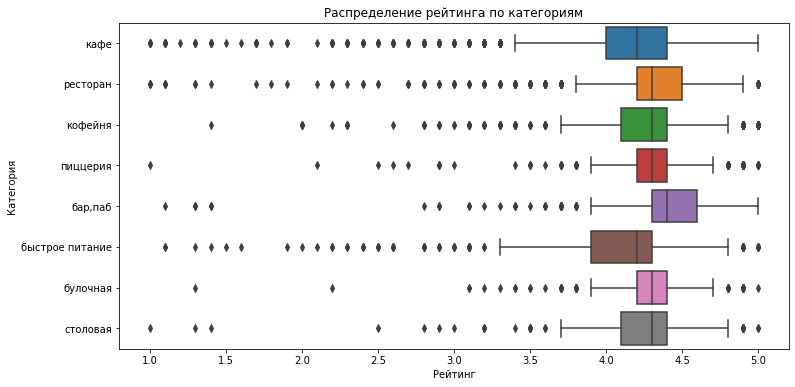

In [46]:
plt.figure(figsize=(12,6))
ax = sns.boxplot(x='rating', y='category', data=moscow_places) 
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение рейтинга по категориям')
plt.xlabel('Рейтинг')
plt.ylabel('Категория')
# отображаем график на экране
plt.show()

Средние рейтинги заведений не так сильно отличаются в зависимрости от категорий, разница не более, чем на 0,35, и у всех более 4.  
Категория с самым высоким средний рейтигом - бар, паб - 4,39, а с самым низким средним  рейтингом - быстрое питание - 4,05.

### Cредний реуктинг по районам

Посмотрим, как распределен средний рейтинг по районам Москвы.

Подготовим функцию для выведения на карту Москвы.

In [47]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

#задаем функцию по имени horoplet
#функция принимает на входе:
#df - датафрейм, по данным из которого будем строить карту
#distr_and_cat - названия столбцов с названиями районов и показателя, по которому будем строить карту
#color - цветовую карту
#text - подпись к легенде
def horoplet(df, distr_and_cat=['district', 'rating'], color='YlOrBr', text='рейтинг заведений'):

    # создаём карту Москвы
    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

    # создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
    Choropleth(
        geo_data=state_geo,
        data=df,
        columns=distr_and_cat,
        key_on='feature.name',
        fill_color=color,
        fill_opacity=0.8,
        legend_name=text,
    ).add_to(m)

    # выводим карту
    return m

In [48]:
#сгруппируем данные по районам
mean_rating_distr = (moscow_places.groupby(['district'])
                 #считаем средний рейтинг
                    .agg({'rating': 'mean'})
                #округляем значения до сотых
                    .round(2)
                 #сбрасываем индекс
                    .reset_index())
#строим карту
horoplet(mean_rating_distr, ['district', 'rating'], 'YlGn', 'Средний рейтинг заведений по районам')

По карте мы видим, что заведения с самым высоким рейтинго снаходятся в ЦАО, а с самым низким рейтингом в ЮВАО.

### Все заведения на карте

Отобразим все заведения на карте Москвы.

In [49]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
moscow_places.apply(create_clusters, axis=1)

# выводим карту
m

### Топ-15 улиц по количеству заведений

Посчитаем количество завдеений для каждой улицы и посмотрим на 15 самых популярных улиц.

In [51]:
top_15_street = pd.DataFrame(moscow_places['street']
                             .value_counts()
                             .head(15)
                             .reset_index()
                             .rename(columns={'index': 'street', 'street': 'count'}))
top_15_street

,street,count
0,проспект Мира,183
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [52]:
# строим столбчатую диаграмму 
fig = px.bar(top_15_street.sort_values(by='count'), # загружаем данные
             x='count', # указываем столбец с данными для оси X
             y='street', # указываем столбец с данными для оси Y
             text='count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве мест внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Топ-15 самых распространенных для заведений улиц',
                   xaxis_title='Количество заведений',
                   yaxis_title='Улица')
fig.show() # выводим график

Мы видим, что самая популярная для заведений улица - это проспект Мира, на нем аж 184 заведения, на втором месте - Профсоюзная улица - 122 заведения. Обе эти улицы проходят через центр и рядом с туристическими местами, а проспект мира еще и одна из самых длинных улиц Москвы.

Отфильтруем наш датасет, оставив только заведения из топ 15 улиц.

In [53]:
#сделаем из столбца с названиями заведений список
top_15_street_list  = top_15_street['street'].tolist()
#отфильтруем датасет
top_15_street_moscow_places = moscow_places.query('street in @top_15_street_list')

Посмотрим на категории.

In [54]:
#посчитаем заведения в каждой категории.
category_top_15_street = pd.DataFrame(top_15_street_moscow_places['category'].value_counts())


# делаем интерактивную круговую диаграму
fig = go.Figure(data=[go.Pie(labels=category_top_15_street.index, 
                             values=category_top_15_street['category'],
                             pull = [0.1, 0])])
# добавляем на график название
fig.update_layout(title='Категории заведений топ 15 улиц Москвы по количеству заведений', 
                  # ширину графика
                  width=700, 
                  # высоту графика
                  height=500,
                  # настройки легенды
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Наименование категории',
                                    showarrow=False)])
# выводим график на экран
fig.show()

Мы видим, что 28,1% заведений являются кафе, 26% рестораны и 17,5% кофейни.

Посмотрим, как эти заведения распределены по районам Москвы

In [55]:
#сгруппируем данные по району и категории
top_15_street_cat = (top_15_street_moscow_places.groupby(['street', 'category'])
                 #считаем количество заведений
                    .agg({'name': 'count'})
                 #переименовываем столбец
                    .rename(columns={'name': 'count'})
                 #сбрасываем индекс
                    .reset_index())

#задаем колонки для нашей столбчатой диаграммы
fig = px.bar(top_15_street_cat, x='street', y='count', color='category')

fig.update_xaxes(tickangle=20)
# оформляем график
fig.update_layout(title='Количество заведений по улицам и категориям Топ-15 улиц',
                  xaxis_title='Улица',
                  yaxis_title='Количество заведений',
                  # ширину графика
                  width=900, 
                  # высоту графика
                  height=500,
                  # настройки легенды
                  legend=dict(
                      x=1,
                      y=1,
                      title="Категория заведений")
                 )



fig.show()

Из топ-15 улиц по категориям лидеры:
- бар, паб - Ленинградский проспект - 15 заведений,
- быстрое питание - проспект Мира - 21 заведение,
- кафе - проспект Мира - 53 заведения,
- кофейня - проспект Мира - 36 заведений,
- пиццерия - Профсоюзная улица - 15 заведений,
- ресторан - проспект Мира - 45 заведений,
- столовая - Варшавское шоссе - 7 заведений,
- булочная - Ленинградский проспект, Профсоюзная улица и проспект Мира - по 4 заведения.  
Как видно, проспект Мира лидер практически по всем категриям.

### Улицы с одним объектом общепита

Найдем улицы с одним заведением.

In [56]:
streets = pd.DataFrame(moscow_places['street']
                             .value_counts()
                             .reset_index()
                             .rename(columns={'index': 'street', 'street': 'count'}))
print('Улиц с одним заведением общепита', streets[streets['count'] == 1]['street'].nunique())

Улиц с одним заведением общепита 458


В датасете 458 улиц, на которых только одно заведение.

In [57]:
#сделаем из столбца с названием улиц список
one_est_streets = streets[streets['count'] == 1]['street'].tolist()
#отфильтруем датасет по списку
one_est_streets_moscow_places = moscow_places.query('street in @one_est_streets')

#посчитаем заведения в каждой категории.
category_one_est_streets = pd.DataFrame(one_est_streets_moscow_places['category'].value_counts())


# делаем интерактивную круговую диаграму
fig = go.Figure(data=[go.Pie(labels=category_one_est_streets.index, 
                             values=category_one_est_streets['category'],
                             pull = [0.1, 0])])
# добавляем на график название
fig.update_layout(title='Категории единственных на улице заведений', 
                  # ширину графика
                  width=700, 
                  # высоту графика
                  height=500,
                  # настройки легенды
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Наименование категории',
                                    showarrow=False)])
# выводим график на экран
fig.show()

In [58]:
# строим столбчатую диаграмму 
fig = px.bar(category_one_est_streets.sort_values(by='category'), # загружаем данные
             x='category', # указываем столбец с данными для оси X
              # указываем столбец с данными для оси Y
             text='category' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве мест внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Категории единственных на улице заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория')
fig.show() # выводим график

In [59]:
#посчитаем заведения в каждой категории.
distr_one_est_streets = pd.DataFrame(one_est_streets_moscow_places['district'].value_counts())


# делаем интерактивную круговую диаграму
fig = go.Figure(data=[go.Pie(labels=distr_one_est_streets.index, 
                             values=distr_one_est_streets['district'],
                             pull = [0.1, 0])])
# добавляем на график название
fig.update_layout(title='Районы с единственными на улице заведениями', 
                  # ширину графика
                  width=900, 
                  # высоту графика
                  height=500,
                  # настройки легенды
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Наименование категории',
                                    showarrow=False)])
# выводим график на экран
fig.show()

In [60]:
# строим столбчатую диаграмму 
fig = px.bar(distr_one_est_streets.sort_values(by='district'), # загружаем данные
             x='district', # указываем столбец с данными для оси X
              # указываем столбец с данными для оси Y
             text='district' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве мест внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Районы с единственными на улице заведениями',
                   xaxis_title='Количество улицк с одним заведением',
                   yaxis_title='Район')
fig.show() # выводим график

Мы видим, что единственные на улице заведения - это чаще всего кафе (34,9%), ресторан (20,3%) и кофейня (18,3%), а районы с улицами с одним заведением чаще всего ЦАО (31,7%) с большим отрывом.  Это может быть связано с тем, что в центре много маленьких улочек и переулков, на котрых может не поместиться даже много заведений.  А в других районах это могут быть промышленные места, где часто бывает одно кафе или кофейня на предприятие.

### Медианный средний чек по районам

Посчитаем медианный рейтинг для каждого района Москвы и отобразим его на карте

In [61]:
#сгруппируем данные по районам
median_bill_distr = (moscow_places.groupby(['district'])
                 #находим медианное значение среднего ччека
                    .agg({'middle_avg_bill': 'median'})
                 #сбрасываем индекс
                    .reset_index())


#строим карту
horoplet(median_bill_distr, ['district', 'middle_avg_bill'], 'YlGn', 'Медианный средний чек заведений по районам')


In [62]:
median_bill_distr.sort_values(by='middle_avg_bill', ascending = False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


Мы видим, что самый большой средний чек в ЗАО и ЦАО, а самый небольшой - в ЮВАО. Это логично, ЦАО и ЗАО считаются самыми дорогими районами Москвы, поэтому и цена в заведении там выше, а ЮВАО один из самых недорогих районов, поэтому и медианный средний чек там ниже.

### Влияние режима работы заведения на рейтинг и средний чек

Посмотрим, есть ли разница в рейтинге заведений и среднем чеке у заведений, которые работают круглосуточно и некруглосуточно.

   is_24/7  middle_avg_bill
0    False            750.0
1     True            425.0


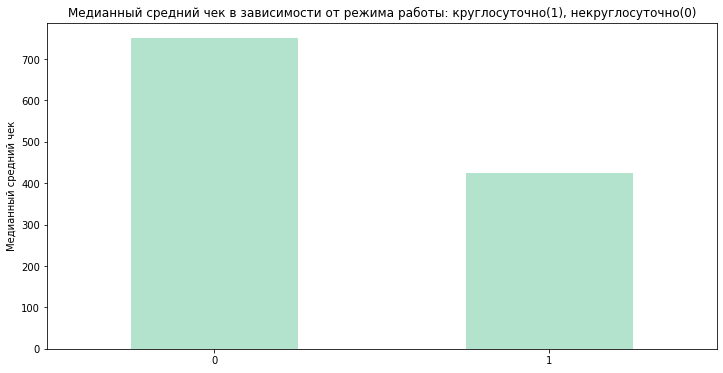

In [63]:
#сгруппируем данные по режимам работы
is_24_7_bill = (moscow_places.groupby(['is_24/7'])
                 #находим медианное значение среднего ччека
                    .agg({'middle_avg_bill': 'median'})
                 #сбрасываем индекс
                    .reset_index())
print(is_24_7_bill)
is_24_7_bill.plot.bar(rot=0,
               legend=False,
               title='Медианный средний чек в зависимости от режима работы: круглосуточно(1), некруглосуточно(0)',
               ylabel='Медианный средний чек',
               figsize=(12, 6),
               cmap='Pastel2');


Мы видим, что у заведений с круглосуточным режимом работы средний чек заметно ниже, чем у тех, которые работаю некруглосуточно. Это логично, ведь дорогие рестораны почти всегда работают ограниченное время. Проверим количество заведений с каждым режимом работы, быть может, круглосуточных заведений очень мало и это искажаетт результат.

In [64]:
(moscow_places.groupby(['is_24/7'])
                 #находим медианное значение среднего ччека
                    .agg({'middle_avg_bill': 'count'})
                 #сбрасываем индекс
                    .reset_index())

,is_24/7,middle_avg_bill
0,False,2923
1,True,226


Круглосуточных завелений действительно сильно меньше (менее, чем 1/10 от некруглосуточных), но при этом их более 200, поэтмоу на результат можно ориентироваться.

Посмотрим, есть ли разница в рейтинге у заведений с разным режимом работы.

   is_24/7    rating
0    False  4.244885
1     True  4.072329


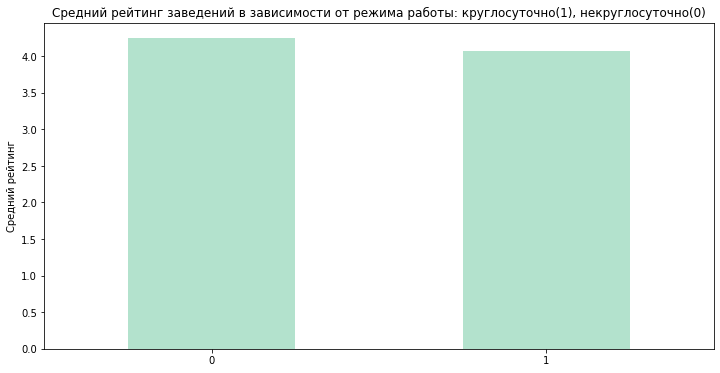

In [65]:
#сгруппируем данные по режимам работы
is_24_7_rating = (moscow_places.groupby(['is_24/7'])
                 #находим среднее значение рейтинга
                    .agg({'rating': 'mean'})
                 #сбрасываем индекс
                    .reset_index())
print(is_24_7_rating)
is_24_7_rating.plot.bar(rot=0,
               legend=False,
               title='Средний рейтинг заведений в зависимости от режима работы: круглосуточно(1), некруглосуточно(0)',
               ylabel='Средний рейтинг',
               figsize=(12, 6),
               cmap='Pastel2');


В рейтинге разница оказалась незначительной - 4,24 у некруглосуточных заведений и 4,07 у круглосуточных.

### Анализ заведений с плохим рейтингом

Посмотрим, как по районам распределены заведения с плохим рейтингом (меньше или равный трем).

In [66]:
#сгруппируем данные по районам с заведениями с рейтингом ниже или равным 3
bad_rating_distr = (moscow_places[moscow_places['rating'] <=3].groupby(['district'])
                 #считаем количество заведений
                    .agg({'rating': 'count'})
                #округляем значения до сотых
                    .round(2)
                 #сбрасываем индекс
                    .reset_index())

#строим карту
horoplet(bad_rating_distr, ['district', 'rating'], 'Reds', 'Количество заведений с плохим рейтингом')


Больше всего заведений с плохим рейтингом в ЮВАО, а меньше всего в ЦАО и СЗАО.

Также посмотрим, как по категориям распределены заведения с плохим рейтингом. 

In [67]:


#посчитаем заведения в каждой категории.
bad_rating_cat = pd.DataFrame(moscow_places[moscow_places['rating'] <=3]['category'].value_counts())


# делаем интерактивную круговую диаграму
fig = go.Figure(data=[go.Pie(labels=bad_rating_cat.index, 
                             values=bad_rating_cat['category'],
                             pull = [0.1, 0])])
# добавляем на график название
fig.update_layout(title='Категории заведений с плохим рейтингом', 
                  # ширину графика
                  width=700, 
                  # высоту графика
                  height=500,
                  # настройки легенды
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Наименование категории',
                                    showarrow=False)])
# выводим график на экран
fig.show()

Мы видим, что более половины заведений с плохим рейтингом (менее или раныпм 3) - это кафе

А также посмотрим, как по районам делится средний чек заведений с плохим рейтингом.

In [68]:
#сгруппируем данные по районам
bad_median_bill_distr = (moscow_places[moscow_places['rating'] <=3].groupby(['district'])
                 #находим медианное значение среднего ччека
                    .agg({'middle_avg_bill': 'median'})
                 #сбрасываем индекс
                    .reset_index())

#строим карту
horoplet(bad_median_bill_distr, 
         ['district', 'middle_avg_bill'], 
         'OrRd',
         'Медианный средний чек заведений с плохим рейтингом по районам')


Самые дорогие заведения с плохим рейтингом в ЗАО и СЗАО, причем медианный чек там больше в несколько раз, по сравнению с плохими заведениями из ЮЗАО, ЮВАО и ЮАО. Из общего распределения среднего чека выделяется СЗАО - по всем заведениям медианный чек там был не самым большим. Получается, что СЗАО - район с не самыми дорогими заведениями, но самыми дорогими плохими заведениями, а ЮЗАО - район с не самыми дешевыми заведениями, но с замыми недорогими дешевыми заведениями. Посмотрим на процент заведений с рейтингом 3 им ниже для каждого района.

In [69]:
#группируем по категориям, выбирая заведения с рейтингом 3 и ниже
bad_distr = (moscow_places[moscow_places['rating'] <=3].groupby(['district'])
                 #считаем количество заведений
                    .agg({'name': 'count'})
                 #переименовываем столбец
                    .rename(columns={'name': 'count_bad'})
                 #сбрасываем индекс
                    .reset_index())

#группируем по категориям, выбирая все заведения
all_distr = (moscow_places.groupby(['district'])
                 #считаем количество заведений
                    .agg({'name': 'count'})
                 #переименовываем столбец
                    .rename(columns={'name': 'count_all'})
                 #сбрасываем индекс
                    .reset_index())

#объединяем наши таблицы по столбцу с названиями районов
percent_distr = all_distr.merge(
    bad_distr,
    on='district', # название столбца, по которому объединять, передают в параметре on
    how='inner', # режим объединения передают в параметре how
    )

#добавляем столбце со значением процента заведений с рейтингом 3 и ниже
percent_distr['bad_percent'] = (percent_distr['count_bad'] * 100 / percent_distr['count_all']).round(1)

#строим карту
horoplet(percent_distr, 
         ['district', 'bad_percent'], 
         'OrRd',
         'Процент заведений с рейтингом 3 и ниже')


По карте мы видим, что процент заведений с плохим (3 и ниже) рейтингом не более 7 % для района, район с самым низким показателем - ЦАО, несмотря на самое большое количество заведений, возможно, заведения с лохим рейтингом не могут удержаться в дорогом и ходовом районе, а район с самым высоким процентом заведений с плохим рейтингом - ЮВАО.

**Вывод**  
Мы провели анализ данных:

- больше половины всех заведений - это кафе (28,3 %) и рестораны (24,3 %), а третьем месте идут кофейни (16,8%),
- есть заведения без мест (это могут быть булочные, кофейни без столиков и т.п.), так и с 1288 мест (могут быть большие ивент-холлы). Также мы видим, что есть явный пик на 40-59 мест, скорее всего, это стандартный размер кафе или ресторана, медианное значение - 75 мест, а среднее количество - 108 мест. 95% заведений имеют до 307 мест, а 99 % заведений имеют 625 мест,
- до 50 мест больше всего кафеен, а свыше 50 - ресторанов,
- По среднему значению больше всего мест у баров, пабов - 125, но втором месте рестораны - 122, меньше всего мест у булочных - 89,
- больше всего мест по медианным значениям у ресторана - 86, на втором месте бар, паб - 82 места, меньше всего мест также у булочных - 50,
- почти 62% заведений в датасете являются несетевыми,
- больше всего сетевых заведений в категории кафе (таких заведений 24,3% от общего числа сетевых), на втором месте рестораны - 22,8%, на третьем кофейни - 22,5%, меньше всего сетевых заведений в категории столовая - их только 2,75%, а больше всего сетевых заведений в процентном соотношении в категории булочная (около 61%), на втором месте - пиццерия (около 52%), меньше всего сетевых заведений в категории бар, паб (около 22%),
- самая популярная сеть с большим отрывом - Шоколадница - 120 заведений, на втором месте Домино'c Пицца - 76 заведений, на третьем - Додо пицца - 74 заведения,
- из Топ-15 сетей 41,2% заведений являются кофейни, 22,8% рестораны и 18,5% пиццерии, больше всего заведений (более чем в 2 раза) в ЦАО, а меньше всего в СЗАО, по районам, то в ЦАО больше всего кофеен и ресторанов, а вот пиццерий больше всего в ЮАО,
- больше всего заведений в ЦАО - это логично, т.к. этот район самый популярный для туризма или просто прогулок,
- средние рейтинги заведений не так сильно отличаются в зависимрости от категорий, разница не более, чем на 0,35, и у всех более 4, категория с самым высоким средний рейтигом - бар, паб - 4,39, а с самым низким средним рейтингом - быстрое питание - 4,05.,
- заведения с самым высоким рейтинго снаходятся в ЦАО, а с самым низким рейтингом в ЮВАО,
- самая популярная для заведений улица - это проспект Мира, на нем аж 184 заведения, на втором месте - Профсоюзная улица - 122 заведения,
- заведения из топ-15 самых популярных улиц: 28,1% заведений являются кафе, 26% рестораны и 17,5% кофейни,
- в датасете 458 улиц, на которых только одно заведение,
- единственные на улице заведения - это чаще всего кафе (34,9%), ресторан (20,3%) и кофейня (18,3%), а районы с улицами с одним заведением чаще всего ЦАО (31,7%) с большим отрывом,
- самый большой средний чек в ЗАО и ЦАО, а самый небольшой - в ЮВАО,
- у заведений с круглосуточным режимом работы средний чек заметно ниже, чем у тех, которые работаю некруглосуточно, а в рейтинге разница оказалась незначительной - 4,24 у некруглосуточных заведений и 4,07 у круглосуточных,
- больше всего заведений с плохим рейтингом в ЮВАО, а меньше всего в ЦАО и СЗАО, более половины заведений с плохим рейтингом (менее или раныпм 3) - это кафе, СЗАО - район с не самыми дорогими заведениями, но самыми дорогими плохими заведениями, а ЮЗАО - район с не самыми дешевыми заведениями, но с замыми недорогими дешевыми заведениями, район с самым низким процентом заведений с рейтингом 3 и ниже - ЦАО (не более 1%), а с самым высоким процентом заведений с рейтингом 3 и ниже - ЮВАО (около 7%)

 <a id='step3'></a>  

## Анализ рынка для открытия кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Проанализируем рынок кофеен.

### Количество кофеен

Посмотрим, сколько всего кофеен в датасете.

In [70]:
print('Всего кофеен в датасете - ',len(moscow_places.query('category == "кофейня"')))

Всего кофеен в датасете -  1413


В датасете 1413 кофеен, посмотрим, как они распределены по районам.

In [71]:
#группируем по категориям, выбирая заведения с рейтингом 3 и ниже
coffee_distr = (moscow_places.query('category == "кофейня"').groupby(['district'])
                 #считаем количество заведений
                    .agg({'name': 'count'})
                 #переименовываем столбец
                    .rename(columns={'name': 'count_coffee'})
                 #сбрасываем индекс
                    .reset_index()
                #сортируем таблицу по убыванию
                    .sort_values(by='count_coffee', ascending=False))

#группируем по категориям, выбирая все заведения
all_distr = (moscow_places.groupby(['district'])
                 #считаем количество заведений
                    .agg({'name': 'count'})
                 #переименовываем столбец
                    .rename(columns={'name': 'count_all'})
                 #сбрасываем индекс
                    .reset_index()
                    )

#объединяем наши таблицы по столбцу с названиями районов
coffee_percent_distr = all_distr.merge(
    coffee_distr,
    on='district', # название столбца, по которому объединять, передают в параметре on
    how='inner', # режим объединения передают в параметре how
    )

#добавляем столбце со значением процента заведений с рейтингом 3 и ниже
coffee_percent_distr['coffee_percent'] = ((coffee_percent_distr['count_coffee'] * 100 
                                           / coffee_percent_distr['count_all'])
                                       .round(1))

# делаем интерактивную круговую диаграму
fig = go.Figure(data=[go.Pie(labels=coffee_distr['district'], 
                             values=coffee_distr['count_coffee'],
                             pull = [0.1, 0])])
# добавляем на график название
fig.update_layout(title='Распределение кофеен по районам', 
                  # ширину графика
                  width=700, 
                  # высоту графика
                  height=500,
                  # настройки легенды
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Район',
                                    showarrow=False)])
# выводим график на экран
fig.show()

#строим карту
horoplet(coffee_percent_distr, 
         ['district', 'coffee_percent'], 
         'YlOrBr',
         'Процент кофеен от общего числа заведений')



В абсолютном значении больше всего кофеен в ЦАО (428 заведений, 30,3% всех кофеен в этом районе), на втором месте САО (193 заведения, 13,7%), меньше всего кофеен в СЗАО(62 заведения, 4,39%), а вот в относительном (относительно всех заведений) кофеен больше всего в САО (около 20-21%), а ЦАО(около 18-20%) уже на втором месте, а меньше всего в ЮАО, ЮВАО и ЮЗАО (около 13-14%).

### Круглосуточные кофейни

Посмотрим, есть ли круглосуточные кофейни.

In [72]:
print('Всего кофеен - ', len(moscow_places.query('category == "кофейня"')))
print('Всего круглосуточных кофеен - ', len(moscow_places[moscow_places['is_24/7'] == True].query('category == "кофейня"')))


Всего кофеен -  1413
Всего круглосуточных кофеен -  59


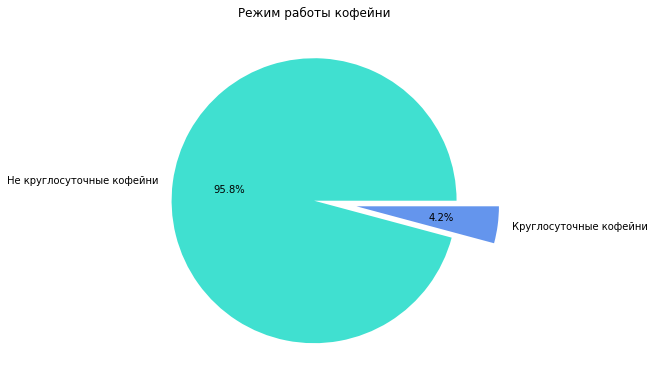

In [73]:
# построим круговую диаграмму
is_24_coffee = moscow_places.query('category == "кофейня"')['is_24/7'].value_counts()
coffe_label = ['Не круглосуточные кофейни', 'Круглосуточные кофейни']
colors = ['#40E0D0','#6495ED']

fig, ax = plt.subplots(figsize=(9, 9))
ax.pie(is_24_coffee, labels=coffe_label, explode = [0, 0.3], autopct='%.1f%%', colors=colors)
ax.set_title('Режим работы кофейни')
plt.tight_layout()



В датасете всего 59 круглосуточных кофеен - это 4,2% от общего числа кофеен являются круглосуточными.

### Рейтинги кофеен

Посмотрим на рейтинги кофеен и как они распределены по районам.

In [74]:
print('Средний рейтинг кофеен по Москве - ', moscow_places.query('category == "кофейня"')['rating'].mean().round(2))

Средний рейтинг кофеен по Москве -  4.28


In [75]:
#группируем по категориям, выбирая заведения с рейтингом 3 и ниже
coffee_rating_distr = (moscow_places.query('category == "кофейня"').groupby(['district'])
                 #считаем количество заведений
                    .agg({'rating': 'mean'})
                 #сбрасываем индекс
                    .reset_index())


#строим карту
horoplet(coffee_rating_distr, 
         ['district', 'rating'], 
         'YlOrBr',
         'Средний рейтинг кофеен')


Средний рейтинг кофеен по Москве - 4.28, кофейни с самым высоким рейтингом находятся в ЦАО и СЗАО(4,31-4,34), а с самым низким рейтингом - в САО и ЗАО (4,20-4,22).

### Cтоимость чашки капучино

Посмотрим, есть за разница в рейтинге в зависимости от медианной ценой чашки капучино.

In [76]:
#создаем функцию, которая на входе принимает значение рейтинга и выдает категорию рейтинга
def categorize_rating(rating):
    try:
        if 1 <= rating <= 3:
            return 'D - [1-3)'
        elif 3 < rating <= 4:
            return 'C - (3-4]'
        elif 4 < rating <= 4.5:
            return 'B - (4-4,5]'
        elif 4.5 < rating :
            return 'A - (4,5-5]'
    except:
        pass

In [77]:
#применяем функцию к нашему датасету
moscow_places['rating_category'] = moscow_places['rating'].apply(categorize_rating)

In [78]:
#проверяем, что категория рейтинга проставилась верно
moscow_places[['name', 'rating', 'rating_category']].sample(5)

,name,rating,rating_category
5877,хорека,4.4,"B - (4-4,5]"
1273,kvartal green garden,4.4,"B - (4-4,5]"
6741,пиццаменто,4.3,"B - (4-4,5]"
4195,шикари,4.2,"B - (4-4,5]"
7204,кафе,2.2,D - [1-3)


In [79]:
#группируем данные по кофейням по категории рейтинга
cup_rating = (moscow_places.query('category == "кофейня"').groupby(['rating_category'])
                 #считаем медианную цену чашки капучино
                    .agg({'middle_coffee_cup': 'median', 'name':'count'})
                 #сбрасываем индекс
                    .reset_index()
                  #переименовываем столбец
                    .rename(columns={'name': 'count'})
                 #сортируем категории в алфавитном\циферном порядке
                    .sort_values(by='rating_category'))
cup_rating

,rating_category,middle_coffee_cup,count
0,"A - (4,5-5]",170.0,241
1,"B - (4-4,5]",174.0,956
2,C - (3-4],128.5,198
3,D - [1-3),97.5,18


In [80]:
# строим столбчатую диаграмму 
fig = px.bar(cup_rating, # загружаем данные
             x='middle_coffee_cup', # указываем столбец с данными для оси X
             y='rating_category', # указываем столбец с данными для оси Y
             text='middle_coffee_cup' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве мест внутри столбца графика
            )
# оформляем график
fig.update_layout(title='зависимость рейтинга и медианной цены чашки капучино',
                   xaxis_title='Медианная цена чашки капучино',
                   yaxis_title='Рейтинг кофейни')
fig.show() # выводим график

Мы видим, что самый высокий рейтинг у кофеен с медианной ценой чашки капучино около 170, при увеличении или уменьшении цены рейтинг снижается. Возможно, к заведениям с высокой ценой посетители более требовательны, а в заведениях с более низкой ценой приходится экономить на оформлении или качестве кофе, что снижает рейтинг заведения.

Проверим наше наблюдение, и взглянем на зависимость наоборот.

In [81]:

#добавляем столбец 'middle_cup_cat' со значениями категорий цены чашки капучино
moscow_places['middle_cup_cat'] = pd.qcut(moscow_places['middle_coffee_cup'], q=5)

#выводим первые 5 строк
moscow_places.query('category == "кофейня"')[['name', 'middle_coffee_cup', 'middle_cup_cat']].sample(5)

,name,middle_coffee_cup,middle_cup_cat
610,напитки со всего мира,NaN,NaN
3970,les,200.0,"(185.0, 246.8]"
7392,cofefest,95.0,"(59.999, 110.0]"
422,coffeebar'17,NaN,NaN
100,take and wake,180.0,"(150.0, 185.0]"


In [82]:
#группируем данные по кофейням по категории рейтинга
middle_cup_cat = (moscow_places.query('category == "кофейня"').groupby(['middle_cup_cat'])
                 #считаем медианную цену чашки капучино
                    .agg({'rating': 'mean'})
                 #округляем до сотых
                    .round(2)
                 #сортируем категории в алфавитном\циферном порядке
                    .sort_values(by='middle_cup_cat'))
middle_cup_cat

,rating
middle_cup_cat,
"(59.999, 110.0]",4.15
"(110.0, 150.0]",4.34
"(150.0, 185.0]",4.41
"(185.0, 246.8]",4.39
"(246.8, 1568.0]",4.28


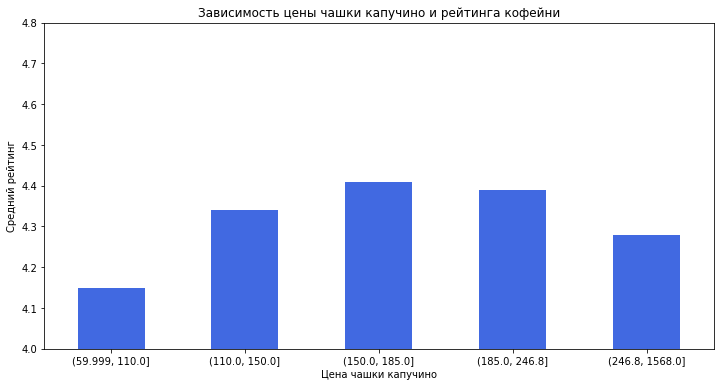

In [83]:
#строим столбчатую диаграмму
middle_cup_cat.plot.bar(rot=0,
               legend=False,
               title='Зависимость цены чашки капучино и рейтинга кофейни',
               ylabel='Средний рейтинг',
               xlabel='Цена чашки капучино',
               ylim=(4,4.8),
               figsize=(12, 6),
               color='royalblue');

Разница в рейтинге оказалась не очень большой в зависимости от цены чашки капучино - от 4,15 до 4,39. Самый высокий рейтинг у заведений с ценой чашки капучино от 150 до 185.

Посмотрим, как медианная цена на чашку капучино распределегна по районам.

In [85]:
#сгруппируем данные по районам
median_coffee_distr = (moscow_places.query('category == "кофейня"').groupby(['district'])
                 #находим медианное значение среднего ччека
                    .agg({'middle_coffee_cup': 'median'})
                 #сбрасываем индекс
                    .reset_index())


#строим карту
horoplet(median_coffee_distr, ['district', 'middle_coffee_cup'], 'YlGn', 'Медианная цена чашки капучино по районам')


Самая высокая медианная цена чашки капучино в ЦАО, ЗАО, ЮЗАО (188-199), а самая низкая в ВАО (135-146).

### Количество мест в кофейне

Посмотрим, есть ли разница в рейтинге кофеен, в зависимости от количества в ней мест.

In [87]:
#группируем данные по кофейням по категории рейтинга
seats_rating = (moscow_places.query('category == "кофейня"').groupby(['rating_category'])
                 #считаем медианную цену чашки капучино
                    .agg({'seats': 'median'})
                 #сбрасываем индекс
                    .reset_index()
                 #сортируем категории в алфавитном\циферном порядке
                    .sort_values(by='rating_category'))
seats_rating

,rating_category,seats
0,"A - (4,5-5]",70.0
1,"B - (4-4,5]",75.5
2,C - (3-4],96.0
3,D - [1-3),60.0


In [88]:
# строим столбчатую диаграмму 
fig = px.bar(seats_rating, # загружаем данные
             x='seats', # указываем столбец с данными для оси X
             y='rating_category', # указываем столбец с данными для оси Y
             text='seats' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве мест внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Зависимость рейтинга и медианного количества мест в кофейне',
                   xaxis_title='Медианное количество мест в кофейне',
                   yaxis_title='Рейтинг кофейни')
fig.show() # выводим график

Можем наблюдать, что посетители не люят, когда мест очень много в кофейне, но и когда мало, самый высокий рейтинг у кофеен на 70 мест.

**Вывод**  
В анализируемых данных представленно 1413 кофеен по Москве, из них только 4,2 % круглосуточные. 

Больше всего кофеен в ЦАО (428), а меньше всего в СЗАО (62). В относительном (относительно всех заведений) кофеен больше всего в САО (около 20-21%), а ЦАО(около 18-20%) уже на втором месте, а меньше всего в ЮАО, ЮВАО и ЮЗАО (около 13-14%). 

Средний рейтинг кофеен по Москве - 4.28, кофейни с самым высоким рейтингом находятся в ЦАО и СЗАО(4,31-4,34), а с самым низким рейтингом - в САО и ЗАО (4,20-4,22).

Разница в рейтинге оказалась не очень большой в зависимости от цены чашки капучино - от 4,15 до 4,39. Самый высокий рейтинг у заведений с ценой чашки капучино от 150 до 185.

Самый высокий рейтинг у кофеен с медианной ценой чашки капучино около 170, при увеличении или уменьшении цены рейтинг снижается.

Самая высокая медианная цена чашки капучино в ЦАО, ЗАО, ЮЗАО (188-199), а самая низкая в ВАО (135-146).

Самый высокий рейтинг у кофеен на 70 мест.

 <a id='step4'></a>  

## Презентация

https://drive.google.com/file/d/1fKqG4dgVXGJf_cgMKY7hBXhHjEIPbWj6/view?usp=sharing

 <a id='step5'></a>  

## Вывод

Мы подготовили данные к анализу:  
  
- проверили на яаные дубли, и удалили неявные,
- проверили на пропуски,
- добавили столбцы с названием улицы и с указанием, работает ли заведение 24/7.
 
Мы провели анализ данных:
  
- Больше половины всех заведений - это кафе (28,3 %) и рестораны (24,3 %), а третьем месте идут кофейни (16,8%).
- Есть заведения без мест (это могут быть булочные, кофейни без столиков и т.п.), так и с 1288 мест (могут быть большие ивент-холлы). Также мы видим, что есть явный пик на 40-59 мест, скорее всего, это стандартный размер кафе или ресторана, медианное значение - 75 мест, а среднее количество - 108 мест. 95% заведений имеют до 307 мест, а 99 % заведений имеют 625 мест.
- До 50 мест больше всего кафеен, а свыше 50 - ресторанов.
- По среднему значению больше всего мест у баров, пабов - 125, но втором месте рестораны - 122, меньше всего мест у булочных - 89.
- Больше всего мест по медианным значениям у ресторана - 86, на втором месте бар, паб - 82 места, меньше всего мест также у булочных - 50.
- Почти 62% заведений в датасете являются несетевыми.
- Больше всего сетевых заведений в категории кафе (таких заведений 24,3% от общего числа сетевых), на втором месте рестораны - 22,8%, на третьем кофейни - 22,5%, меньше всего сетевых заведений в категории столовая - их только 2,75%, а больше всего сетевых заведений в процентном соотношении в категории булочная (около 61%), на втором месте - пиццерия (около 52%), меньше всего сетевых заведений в категории бар, паб (около 22%).
- Самая популярная сеть с большим отрывом - Шоколадница - 120 заведений, на втором месте Домино'c Пицца - 76 заведений, на третьем - Додо пицца - 74 заведения.
- Из Топ-15 сетей 41,2% заведений являются кофейни, 22,8% рестораны и 18,5% пиццерии, больше всего заведений (более чем в 2 раза) в ЦАО, а меньше всего в СЗАО, по районам, то в ЦАО больше всего кофеен и ресторанов, а вот пиццерий больше всего в ЮАО.
- Больше всего заведений в ЦАО - это логично, т.к. этот район самый популярный для туризма или просто прогулок.
- Средние рейтинги заведений не так сильно отличаются в зависимрости от категорий, разница не более, чем на 0,35, и у всех более 4, категория с самым высоким средний рейтигом - бар, паб - 4,39, а с самым низким средним рейтингом - быстрое питание - 4,05.,
- Заведения с самым высоким рейтинго снаходятся в ЦАО, а с самым низким рейтингом в ЮВАО.
- Самая популярная для заведений улица - это проспект Мира, на нем аж 184 заведения, на втором месте - Профсоюзная улица - 122 заведения.
- Заведения из топ-15 самых популярных улиц: 28,1% заведений являются кафе, 26% рестораны и 17,5% кофейни.
- В датасете 458 улиц, на которых только одно заведение.
- Единственные на улице заведения - это чаще всего кафе (34,9%), ресторан (20,3%) и кофейня (18,3%), а районы с улицами с одним заведением чаще всего ЦАО (31,7%) с большим отрывом.
- Самый большой средний чек в ЗАО и ЦАО, а самый небольшой - в ЮВАО.
- У заведений с круглосуточным режимом работы средний чек заметно ниже, чем у тех, которые работаю некруглосуточно, а в рейтинге разница оказалась незначительной - 4,24 у некруглосуточных заведений и 4,07 у круглосуточных.
- Больше всего заведений с плохим рейтингом в ЮВАО, а меньше всего в ЦАО и СЗАО, более половины заведений с плохим рейтингом (менее или раныпм 3) - это кафе, СЗАО - район с не самыми дорогими заведениями, но самыми дорогими плохими заведениями, а ЮЗАО - район с не самыми дешевыми заведениями, но с замыми недорогими дешевыми заведениями, район с самым низким процентом заведений с рейтингом 3 и ниже - ЦАО (не более 1%), а с самым высоким процентом заведений с рейтингом 3 и ниже - ЮВАО (около 7%).

Мы провели анализ кофеен Москвы:  
  
- В анализируемых данных представленно 1413 кофеен по Москве, из них только 4,2 % круглосуточные. 
- Больше всего кофеен в ЦАО (428), а меньше всего в СЗАО (62). В относительном (относительно всех заведений) кофеен больше всего в САО (около 20-21%), а ЦАО(около 18-20%) уже на втором месте, а меньше всего в ЮАО, ЮВАО и ЮЗАО (около 13-14%). 
- Средний рейтинг кофеен по Москве - 4.28, кофейни с самым высоким рейтингом находятся в ЦАО и СЗАО(4,31-4,34), а с самым низким рейтингом - в САО и ЗАО (4,20-4,22).
- Разница в рейтинге оказалась не очень большой в зависимости от цены чашки капучино - от 4,15 до 4,39. Самый высокий рейтинг у заведений с ценой чашки капучино от 150 до 185.
- Самый высокий рейтинг у кофеен с медианной ценой чашки капучино около 170, при увеличении или уменьшении цены рейтинг снижается.
- Самая высокая медианная цена чашки капучино в ЦАО, ЗАО, ЮЗАО (188-199), а самая низкая в ВАО (135-146).
- Самый высокий рейтинг у кофеен на 70 мест.

 <a id='step6'></a>  

## Рекомендация по открытию кофейни

При рекомендации мы ориентируемся на рейтинг, как на единсвенный доступный показатель.  
Поэтому можем рекомендовать открытие кофейни в Северо-Западном административном округе Москвы, т.к. в этом округе не так много кофеен, как в Центральном административном округе, но при этом в нем мало кофеен, по сравнению с другими заведениями. Плюс рейтинг кофеен в этом округе достаточно высокий, чтто говорит о том, что посетителям они нравятся.  
Рекомендуем открывать не круглосуточную кофейню на 70 мест, цену чашки капучино лучше держать около 170.